# Importing The Libraries

In [1]:
import numpy as np
import cv2
import pandas as pd

In [2]:
from matplotlib import pyplot as plt
import os

In [3]:
from skimage.filters import roberts, sobel, scharr, prewitt
from scipy import ndimage as nd

In [4]:
import gif2numpy


# Extract Features from Images

In [30]:
# Next time change th path format
train_path = "D:\\Data sets\\DRIVE\\training"
train_ids = next(os.walk(train_path + "\\images"))[2]
gt_ids = next(os.walk(train_path + "\\1st_manual"))[2]

In [31]:
gt_ids

['21_manual1.gif',
 '22_manual1.gif',
 '23_manual1.gif',
 '24_manual1.gif',
 '25_manual1.gif',
 '26_manual1.gif',
 '27_manual1.gif',
 '28_manual1.gif',
 '29_manual1.gif',
 '30_manual1.gif',
 '31_manual1.gif',
 '32_manual1.gif',
 '33_manual1.gif',
 '34_manual1.gif',
 '35_manual1.gif',
 '36_manual1.gif',
 '37_manual1.gif',
 '38_manual1.gif',
 '39_manual1.gif',
 '40_manual1.gif']

In [32]:
train_ids

['21_training.tif',
 '22_training.tif',
 '23_training.tif',
 '24_training.tif',
 '25_training.tif',
 '26_training.tif',
 '27_training.tif',
 '28_training.tif',
 '29_training.tif',
 '30_training.tif',
 '31_training.tif',
 '32_training.tif',
 '33_training.tif',
 '34_training.tif',
 '35_training.tif',
 '36_training.tif',
 '37_training.tif',
 '38_training.tif',
 '39_training.tif',
 '40_training.tif']

In [23]:
def originalImg(img,df):
    img2 = img.reshape(-1)
    df['Original_Image'] = img2
    return df,img2

In [9]:
def gaborFilter(img2,df):
    #Generate Gabor features
    num = 1  #To count numbers up in order to give Gabor features a lable in the data frame
    kernels = []
    for theta in range(2):   #Define number of thetas
        theta = theta / 4. * np.pi
        for sigma in (1, 3):  #Sigma with 1 and 3
            for lamda in np.arange(0, np.pi, np.pi / 4):   #Range of wavelengths
                for gamma in (0.05, 0.5):   #Gamma values of 0.05 and 0.5


                    gabor_label = 'Gabor' + str(num)  #Label Gabor columns as Gabor1, Gabor2, etc.
                    # print(gabor_label)
                    ksize=5
                    kernel = cv2.getGaborKernel((ksize, ksize), sigma, theta, lamda, gamma, 0, ktype=cv2.CV_32F)    
                    kernels.append(kernel)
                    #Now filter the image and add values to a new column 
                    fimg = cv2.filter2D(img2, cv2.CV_8UC3, kernel)
                    filtered_img = fimg.reshape(-1)
                    df[gabor_label] = filtered_img  #Labels columns as Gabor1, Gabor2, etc.
                    #print(gabor_label, ': theta=', theta, ': sigma=', sigma, ': lamda=', lamda, ': gamma=', gamma)
                    num += 1  #Increment for gabor column label
    return df

In [10]:
def cannyEdge(df,img):
    #CANNY EDGE
    edges = cv2.Canny(img, 100,200)   #Image, min and max values
    edges1 = edges.reshape(-1)
    df['Canny_Edge'] = edges1 #Add column to original dataframe
    return df

In [11]:
def the4edgeDetectors(df,img):
    edge_roberts = roberts(img)
    edge_roberts1 = edge_roberts.reshape(-1)
    df['Roberts'] = edge_roberts1
    
    #SOBEL
    edge_sobel = sobel(img)
    edge_sobel1 = edge_sobel.reshape(-1)
    df['Sobel'] = edge_sobel1
    
    #SCHARR
    edge_scharr = scharr(img)
    edge_scharr1 = edge_scharr.reshape(-1)
    df['Scharr'] = edge_scharr1
    
    #PREWITT
    edge_prewitt = prewitt(img)
    edge_prewitt1 = edge_prewitt.reshape(-1)
    df['Prewitt'] = edge_prewitt1
    
    return df

In [12]:
def gmv(df,img):
    #GAUSSIAN with sigma=3

    gaussian_img = nd.gaussian_filter(img, sigma=3)
    gaussian_img1 = gaussian_img.reshape(-1)
    df['Gaussian s3'] = gaussian_img1

    #GAUSSIAN with sigma=7
    gaussian_img2 = nd.gaussian_filter(img, sigma=7)
    gaussian_img3 = gaussian_img2.reshape(-1)
    df['Gaussian s7'] = gaussian_img3

    #MEDIAN with sigma=3
    median_img = nd.median_filter(img, size=3)
    median_img1 = median_img.reshape(-1)
    df['Median s3'] = median_img1

    #VARIANCE with size=3
    variance_img = nd.generic_filter(img, np.var, size=3)
    variance_img1 = variance_img.reshape(-1)
    df['Variance s3'] = variance_img1  #Add column to original dataframe
    return df

In [20]:
def gtImage(gt_path,df):
    frames, exts, image_specs = gif2numpy.convert(gt_path)
    frames = np.array(frames)
    labeled_img = frames.reshape(584, 565,3)
    labeled_img = cv2.cvtColor(labeled_img, cv2.COLOR_BGR2GRAY)
    thresh = 0
    labeled_img = labeled_img > 0
    labeled_img1 = labeled_img.reshape(-1)
    df['Labels'] = labeled_img1
    return df

In [35]:
image_dataset = pd.DataFrame()

In [36]:
for _id in range(20):
#     if _id in (17, 12, 0, 5, 10):
#         print(_id)
#         continue
    print('*',_id)
    image = train_ids[_id]
    gt_image = gt_ids[_id]
    
    df = pd.DataFrame()  #Temporary data frame for each Image
    
    path = train_path + "\\images\\" + image
    print(path)
    
    img = cv2.imread(path)
    img = img[:,:,1]
    df,img2 = originalImg(img,df)
    df['Image_Name'] = image
    df = gaborFilter(img2,df)
    
    df = cannyEdge(df,img)
    
    df = the4edgeDetectors(df,img)
    
    df = gmv(df,img)
    gt_path = train_path + "\\1st_manual\\" + gt_image
    print(gt_path)
    df = gtImage(gt_path,df)
    
    image_dataset = pd.concat([image_dataset,df])
    print(image_dataset.shape)

* 0
D:\Data sets\DRIVE\training\images\21_training.tif
(329960,)
D:\Data sets\DRIVE\training\1st_manual\21_manual1.gif
329960
(329960, 44)
* 1
D:\Data sets\DRIVE\training\images\22_training.tif
(329960,)
D:\Data sets\DRIVE\training\1st_manual\22_manual1.gif
329960
(659920, 44)
* 2
D:\Data sets\DRIVE\training\images\23_training.tif
(329960,)
D:\Data sets\DRIVE\training\1st_manual\23_manual1.gif
329960
(989880, 44)
* 3
D:\Data sets\DRIVE\training\images\24_training.tif
(329960,)
D:\Data sets\DRIVE\training\1st_manual\24_manual1.gif
329960
(1319840, 44)
* 4
D:\Data sets\DRIVE\training\images\25_training.tif
(329960,)
D:\Data sets\DRIVE\training\1st_manual\25_manual1.gif
329960
(1649800, 44)
* 5
D:\Data sets\DRIVE\training\images\26_training.tif
(329960,)
D:\Data sets\DRIVE\training\1st_manual\26_manual1.gif
329960
(1979760, 44)
* 6
D:\Data sets\DRIVE\training\images\27_training.tif
(329960,)
D:\Data sets\DRIVE\training\1st_manual\27_manual1.gif
329960
(2309720, 44)
* 7
D:\Data sets\DRIVE\

In [37]:
image_dataset.head()

,Original_Image,Image_Name,Gabor1,Gabor2,Gabor3,Gabor4,Gabor5,Gabor6,Gabor7,Gabor8,...,Canny_Edge,Roberts,Sobel,Scharr,Prewitt,Gaussian s3,Gaussian s7,Median s3,Variance s3,Labels
0,0,21_training.tif,0,0,0,0,0,0,0,0,...,0,0.0,0.0,0.0,0.0,0,1,0,0,False
1,0,21_training.tif,0,0,0,0,0,0,0,0,...,0,0.0,0.0,0.0,0.0,0,1,0,0,False
2,0,21_training.tif,0,0,0,0,0,0,0,0,...,0,0.0,0.0,0.0,0.0,0,1,0,0,False
3,0,21_training.tif,0,0,0,0,0,0,0,0,...,0,0.0,0.0,0.0,0.0,0,1,0,0,False
4,0,21_training.tif,0,0,0,0,0,0,0,0,...,0,0.0,0.0,0.0,0.0,0,1,0,0,False


# Train and Test

In [38]:
x = image_dataset.drop(labels = ["Image_Name","Labels"], axis=1)
x[:10]

,Original_Image,Gabor1,Gabor2,Gabor3,Gabor4,Gabor5,Gabor6,Gabor7,Gabor8,Gabor9,...,Gabor32,Canny_Edge,Roberts,Sobel,Scharr,Prewitt,Gaussian s3,Gaussian s7,Median s3,Variance s3
0,0,0,0,0,0,0,0,0,0,0,...,0,0,0.0,0.0,0.0,0.0,0,1,0,0
1,0,0,0,0,0,0,0,0,0,0,...,0,0,0.0,0.0,0.0,0.0,0,1,0,0
2,0,0,0,0,0,0,0,0,0,0,...,0,0,0.0,0.0,0.0,0.0,0,1,0,0
3,0,0,0,0,0,0,0,0,0,0,...,0,0,0.0,0.0,0.0,0.0,0,1,0,0
4,0,0,0,0,0,0,0,0,0,0,...,0,0,0.0,0.0,0.0,0.0,0,1,0,0
5,0,0,0,0,0,0,0,0,0,0,...,0,0,0.0,0.0,0.0,0.0,0,1,0,0
6,0,0,0,0,0,0,0,0,0,0,...,0,0,0.0,0.0,0.0,0.0,0,1,0,0
7,0,0,0,0,0,0,0,0,0,0,...,0,0,0.0,0.0,0.0,0.0,0,1,0,0
8,0,0,0,0,0,0,0,0,0,0,...,0,0,0.0,0.0,0.0,0.0,0,1,0,0
9,0,0,0,0,0,0,0,0,0,0,...,0,0,0.0,0.0,0.0,0.0,0,1,0,0


In [42]:
y = image_dataset["Labels"]
y[:10]

0    False
1    False
2    False
3    False
4    False
5    False
6    False
7    False
8    False
9    False
Name: Labels, dtype: bool

In [43]:
from sklearn.model_selection import train_test_split

In [44]:
X_train, X_test, y_train, y_test = train_test_split(x, y, test_size=0.25, random_state=20)

In [45]:
X_train.shape, X_test.shape

((4949400, 42), (1649800, 42))

# XGBoost Model

In [46]:
import xgboost as xgb

In [47]:
xg_cl = xgb.XGBClassifier(objective='binary:logistic', n_estimators=150, seed=123)
eval_set = [(X_train, y_train), (X_test, y_test)]

In [48]:
xg_cl.fit(X_train, y_train, eval_metric=["error"], eval_set=eval_set, verbose=True)
results = xg_cl.evals_result()

C:\Users\Shirsendu\AppData\Local\Programs\Python\Python38\lib\site-packages\xgboost\sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[0]	validation_0-error:0.06878	validation_1-error:0.06885
[1]	validation_0-error:0.06329	validation_1-error:0.06330
[2]	validation_0-error:0.05998	validation_1-error:0.05992
[3]	validation_0-error:0.05732	validation_1-error:0.05725
[4]	validation_0-error:0.05712	validation_1-error:0.05701
[5]	validation_0-error:0.05587	validation_1-error:0.05570
[6]	validation_0-error:0.05491	validation_1-error:0.05474
[7]	validation_0-error:0.05379	validation_1-error:0.05366
[8]	validation_0-error:0.05328	validation_1-error:0.05310
[9]	validation_0-error:0.05244	validation_1-error:0.05233
[10]	validation_0-error:0.05184	validation_1-error:0.05172
[11]	validation_0-error:0.05119	validation_1-error:0.05108
[12]	validation_0-error:0.05036	validation_1-error:0.05020
[13]	validation_0-error:0.04958	validation_1-error:0.04948
[14]	validation_0-error:0.04937	validation_1-error:0.04927
[15]	validation_0-error:0.04885	validation_1-error:0.04873
[16]	validation_0-error:0.04821	validation_1-error:0.04809
[17]	va

[139]	validation_0-error:0.04178	validation_1-error:0.04223
[140]	validation_0-error:0.04177	validation_1-error:0.04224
[141]	validation_0-error:0.04177	validation_1-error:0.04224
[142]	validation_0-error:0.04176	validation_1-error:0.04224
[143]	validation_0-error:0.04176	validation_1-error:0.04224
[144]	validation_0-error:0.04174	validation_1-error:0.04222
[145]	validation_0-error:0.04173	validation_1-error:0.04223
[146]	validation_0-error:0.04173	validation_1-error:0.04222
[147]	validation_0-error:0.04172	validation_1-error:0.04222
[148]	validation_0-error:0.04172	validation_1-error:0.04222
[149]	validation_0-error:0.04172	validation_1-error:0.04220


In [49]:
predictions = xg_cl.predict(X_test)

In [50]:
# Compute the accuracy: accuracy
accuracy = float(np.sum(predictions == y_test))/y_test.shape[0]
print("accuracy: %f" % (accuracy*100))

accuracy: 95.779549


In [51]:
from sklearn import metrics

In [52]:
from sklearn.metrics import confusion_matrix, f1_score

In [53]:
from sklearn.metrics import classification_report

In [54]:
predict_y = xg_cl.predict(x)

print ("Accuracy on the Original Image = ", metrics.accuracy_score(y, predict_y))
print ("F1 Score on the Original Image = ", f1_score(y, predict_y, average='weighted'))

Accuracy on the Original Image =  0.9581615953448903
F1 Score on the Original Image =  0.9560247281737666


In [55]:
cm = confusion_matrix(y, predict_y)
cm

array([[5948694,   80891],
       [ 195209,  374406]], dtype=int64)

In [56]:
print(classification_report(y, predict_y))

              precision    recall  f1-score   support

       False       0.97      0.99      0.98   6029585
        True       0.82      0.66      0.73    569615

    accuracy                           0.96   6599200
   macro avg       0.90      0.82      0.85   6599200
weighted avg       0.96      0.96      0.96   6599200



In [57]:
tn, fp, fn, tp = cm.ravel()

In [58]:
tn, fp, fn, tp

(5948694, 80891, 195209, 374406)

In [59]:
def getMetrics(cm):
    tn, fp, fn, tp = cm.ravel()
    sen = tp/(tp+fn)
    spe = tn/(tn+fp) 
    acc = (tp + tn)/(tp + tn + fp +fn)
    return sen, spe , acc

In [60]:
Sensitivity, Specificity, Accuracy = getMetrics(cm)
Sensitivity, Specificity, Accuracy 

(0.6572965950685989, 0.9865843171627898, 0.9581615953448903)

# Test on an Image

D:\Data sets\DRIVE\training\images\36_training.tif
(329960,)
D:\Data sets\DRIVE\training\1st_manual\36_manual1.gif
329960


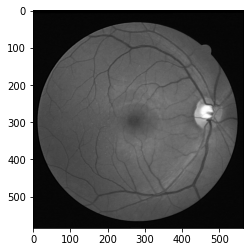

In [61]:
image = train_ids[-5]
gt_image = gt_ids[-5]

tdf = pd.DataFrame()  #Temporary data frame for each Image

path = train_path + "\\images\\" + image
print(path)

img = cv2.imread(path)
img = img[:,:,1]

plt.imshow(img ,cmap = "gray")

tdf,img2 = originalImg(img,tdf)
tdf['Image_Name'] = image
tdf = gaborFilter(img2,tdf)

tdf = cannyEdge(tdf,img)

tdf = the4edgeDetectors(tdf,img)

tdf = gmv(tdf,img)

gt_path = train_path + "\\1st_manual\\" + gt_image
print(gt_path)
tdf = gtImage(gt_path,tdf)

# image_dataset.append(df)
#     df = gtImage()

In [62]:
tdf.head()

,Original_Image,Image_Name,Gabor1,Gabor2,Gabor3,Gabor4,Gabor5,Gabor6,Gabor7,Gabor8,...,Canny_Edge,Roberts,Sobel,Scharr,Prewitt,Gaussian s3,Gaussian s7,Median s3,Variance s3,Labels
0,0,36_training.tif,0,0,0,0,0,0,0,0,...,0,0.000000,0.00000,0.000000,0.000000,0,1,0,0,False
1,0,36_training.tif,0,0,0,0,0,0,0,0,...,0,0.000000,0.00000,0.000000,0.000000,0,1,0,0,False
2,0,36_training.tif,0,0,0,0,0,0,0,0,...,0,0.000000,0.00000,0.000000,0.000000,0,1,0,0,False
3,0,36_training.tif,0,0,0,0,0,0,0,0,...,0,0.000000,0.00000,0.000000,0.000000,0,1,0,0,False
4,0,36_training.tif,0,0,0,0,0,0,0,0,...,0,0.002773,0.00098,0.000735,0.001307,0,1,0,0,False


In [63]:
x = tdf.drop(labels = ["Image_Name","Labels"], axis=1)
x[:10]

,Original_Image,Gabor1,Gabor2,Gabor3,Gabor4,Gabor5,Gabor6,Gabor7,Gabor8,Gabor9,...,Gabor32,Canny_Edge,Roberts,Sobel,Scharr,Prewitt,Gaussian s3,Gaussian s7,Median s3,Variance s3
0,0,0,0,0,0,0,0,0,0,0,...,0,0,0.000000,0.000000,0.000000,0.000000,0,1,0,0
1,0,0,0,0,0,0,0,0,0,0,...,0,0,0.000000,0.000000,0.000000,0.000000,0,1,0,0
2,0,0,0,0,0,0,0,0,0,0,...,0,0,0.000000,0.000000,0.000000,0.000000,0,1,0,0
3,0,0,0,0,0,0,0,0,0,0,...,0,0,0.000000,0.000000,0.000000,0.000000,0,1,0,0
4,0,0,0,0,0,0,0,0,0,0,...,0,0,0.002773,0.000980,0.000735,0.001307,0,1,0,0
5,0,0,0,1,0,0,0,0,0,0,...,1,0,0.003922,0.002192,0.002312,0.002067,0,1,0,0
6,0,0,0,1,0,0,0,0,0,0,...,0,0,0.002773,0.002941,0.003186,0.002614,0,1,1,0
7,1,0,0,1,1,0,0,0,0,0,...,0,0,0.003922,0.000980,0.000735,0.001307,0,1,0,0
8,0,0,0,1,0,0,0,0,0,0,...,0,0,0.000000,0.002773,0.002773,0.002773,0,1,0,0
9,0,0,0,1,0,0,0,0,0,0,...,1,0,0.002773,0.000980,0.000735,0.001307,0,1,0,0


In [64]:
y = tdf["Labels"]
y[:10]

0    False
1    False
2    False
3    False
4    False
5    False
6    False
7    False
8    False
9    False
Name: Labels, dtype: bool

In [65]:
prediction_test = xg_cl.predict(x)

In [66]:
print ("Accuracy on the Original Image = ", metrics.accuracy_score(y, prediction_test))

Accuracy on the Original Image =  0.953554976360771


In [67]:
confusion_matrix(y, prediction_test)

array([[290994,   3082],
       [ 12243,  23641]], dtype=int64)

In [68]:
f1_score(y, prediction_test, average="weighted")

0.9505130949948284

In [69]:
result = prediction_test.reshape((584, 565))

In [70]:
def gtImageDis(gt_path):
    frames, exts, image_specs = gif2numpy.convert(gt_path)
    frames = np.array(frames)
    labeled_img = frames.reshape(584, 565,3)
    labeled_img_dis = cv2.cvtColor(labeled_img, cv2.COLOR_BGR2GRAY)
    return labeled_img_dis

In [71]:
gt = gtImageDis(gt_path)

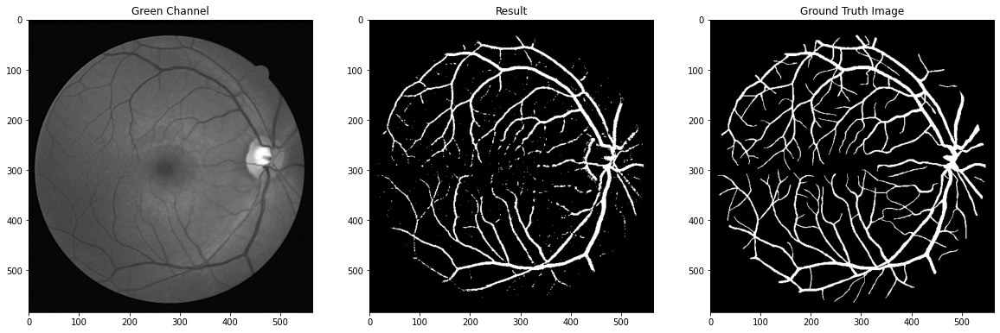

In [72]:
fig, axes = plt.subplots(1, 3, figsize=(20, 20))
ax = axes.ravel()
ax[0].set_title("Green Channel")
ax[0].imshow(img, cmap = 'gray')
ax[1].set_title("Result")
ax[1].imshow(result, cmap = 'gray')
ax[2].set_title("Ground Truth Image")
ax[2].imshow(gt, cmap = 'gray')


In [108]:
c = result*1

array([[0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0],
       ...,
       [0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0]])

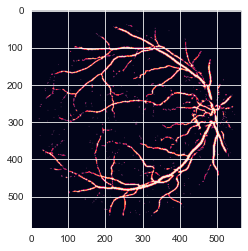

In [109]:
plt.imshow(c)

# Test All 

In [82]:
f1_set = []
score_set = []

In [83]:
from tqdm import tqdm

  0%|          | 0/20 [00:00<?, ?it/s]

D:\Data sets\DRIVE\training\images\21_training.tif
(329960,)
D:\Data sets\DRIVE\training\1st_manual\21_manual1.gif
329960
Accuracy =  0.96973572554249
0.9678937028360316


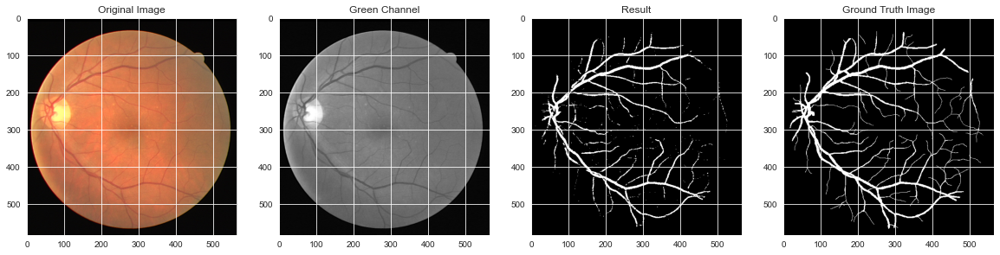

  5%|▌         | 1/20 [00:07<02:18,  7.29s/it]

D:\Data sets\DRIVE\training\images\22_training.tif
(329960,)
D:\Data sets\DRIVE\training\1st_manual\22_manual1.gif
329960
Accuracy =  0.9618196144987271
0.9594344110872722


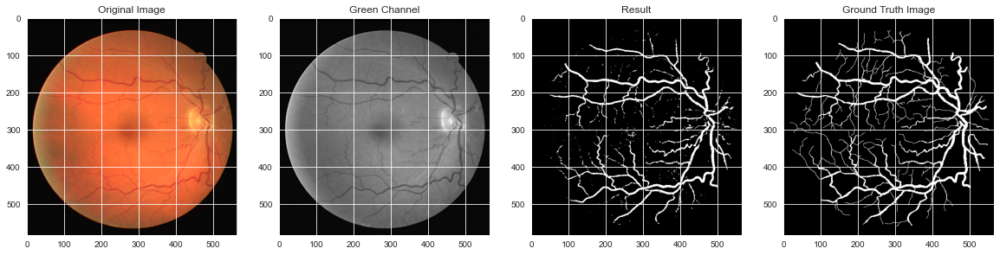

 10%|█         | 2/20 [00:14<02:11,  7.30s/it]

D:\Data sets\DRIVE\training\images\23_training.tif
(329960,)
D:\Data sets\DRIVE\training\1st_manual\23_manual1.gif
329960
Accuracy =  0.9626500181840223
0.962757964858401


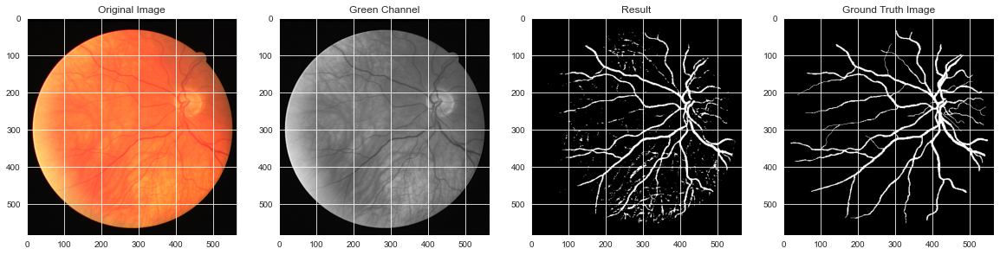

 15%|█▌        | 3/20 [00:22<02:04,  7.34s/it]

D:\Data sets\DRIVE\training\images\24_training.tif
(329960,)
D:\Data sets\DRIVE\training\1st_manual\24_manual1.gif
329960
Accuracy =  0.952276033458601
0.9482057129198046


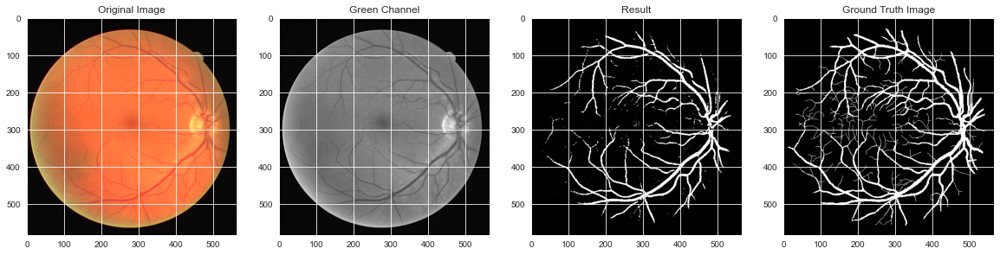

 20%|██        | 4/20 [00:29<01:57,  7.34s/it]

D:\Data sets\DRIVE\training\images\25_training.tif
(329960,)
D:\Data sets\DRIVE\training\1st_manual\25_manual1.gif
329960
Accuracy =  0.9432355437022669
0.9352526191845567


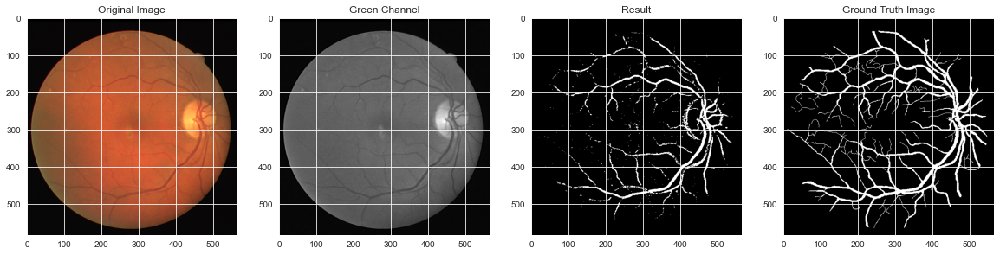

 25%|██▌       | 5/20 [00:36<01:50,  7.34s/it]

D:\Data sets\DRIVE\training\images\26_training.tif
(329960,)
D:\Data sets\DRIVE\training\1st_manual\26_manual1.gif
329960
Accuracy =  0.9578282216026185
0.9552326900636606


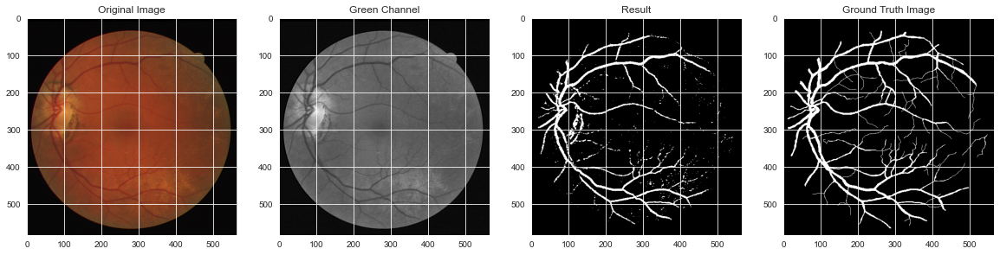

 30%|███       | 6/20 [00:43<01:42,  7.31s/it]

D:\Data sets\DRIVE\training\images\27_training.tif
(329960,)
D:\Data sets\DRIVE\training\1st_manual\27_manual1.gif
329960
Accuracy =  0.9616983876833556
0.9597854954510885


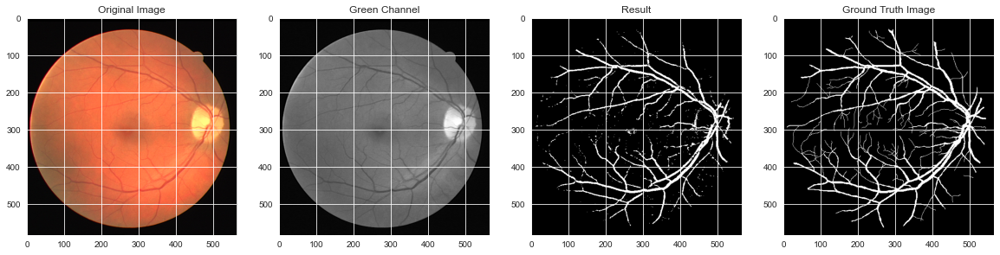

 35%|███▌      | 7/20 [00:51<01:35,  7.38s/it]

D:\Data sets\DRIVE\training\images\28_training.tif
(329960,)
D:\Data sets\DRIVE\training\1st_manual\28_manual1.gif
329960
Accuracy =  0.959752697296642
0.9571446659321456


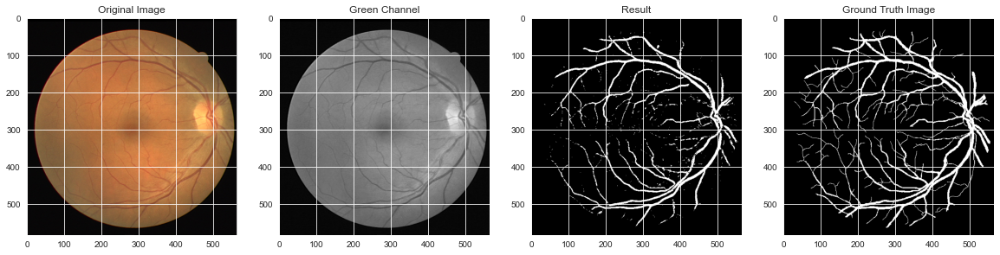

 40%|████      | 8/20 [00:58<01:28,  7.40s/it]

D:\Data sets\DRIVE\training\images\29_training.tif
(329960,)
D:\Data sets\DRIVE\training\1st_manual\29_manual1.gif
329960
Accuracy =  0.9612316644441751
0.9593876468867238


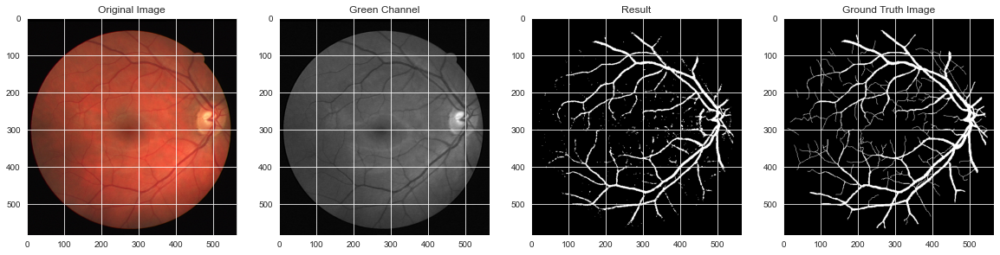

 45%|████▌     | 9/20 [01:06<01:21,  7.37s/it]

D:\Data sets\DRIVE\training\images\30_training.tif
(329960,)
D:\Data sets\DRIVE\training\1st_manual\30_manual1.gif
329960
Accuracy =  0.9586707479694508
0.955353019927354


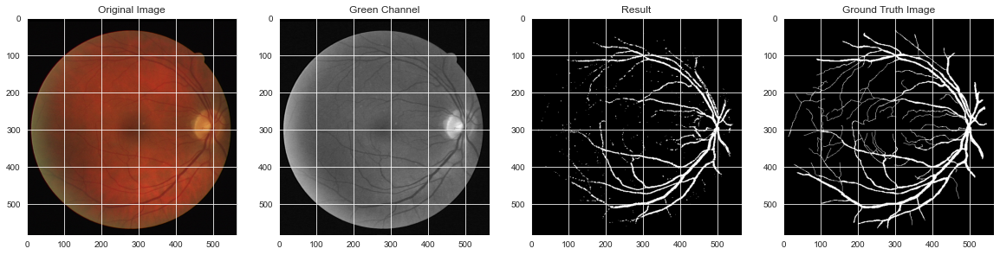

 50%|█████     | 10/20 [01:13<01:13,  7.33s/it]

D:\Data sets\DRIVE\training\images\31_training.tif
(329960,)
D:\Data sets\DRIVE\training\1st_manual\31_manual1.gif
329960
Accuracy =  0.9681597769426598
0.967842731626918


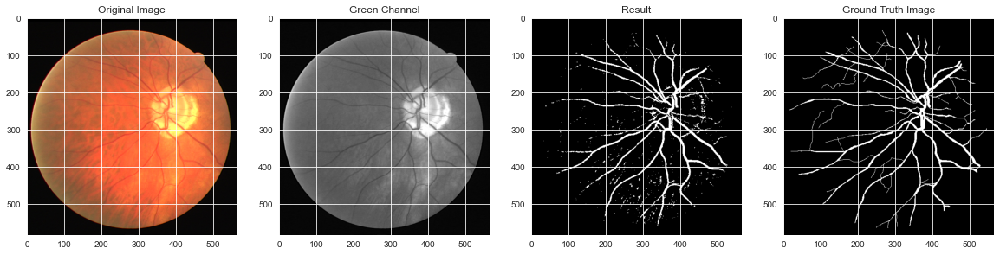

 55%|█████▌    | 11/20 [01:20<01:06,  7.33s/it]

D:\Data sets\DRIVE\training\images\32_training.tif
(329960,)
D:\Data sets\DRIVE\training\1st_manual\32_manual1.gif
329960
Accuracy =  0.9641683840465511
0.9613449820105076


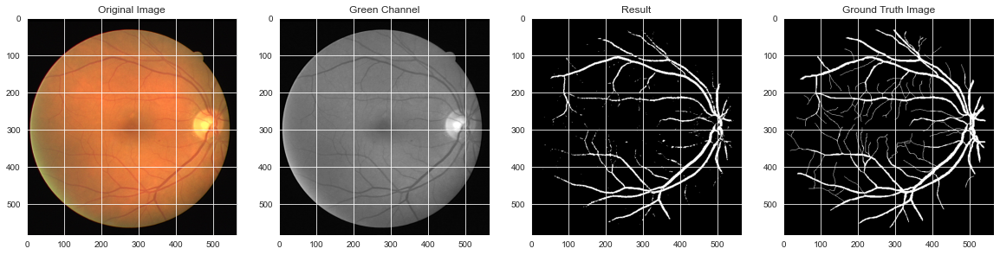

 60%|██████    | 12/20 [01:28<00:58,  7.33s/it]

D:\Data sets\DRIVE\training\images\33_training.tif
(329960,)
D:\Data sets\DRIVE\training\1st_manual\33_manual1.gif
329960
Accuracy =  0.9655806764456297
0.963217825779955


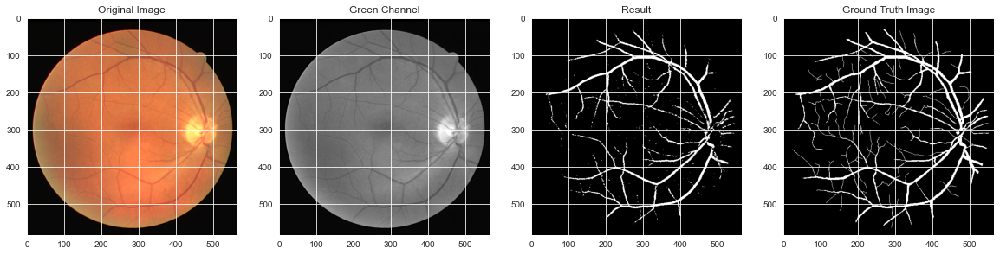

 65%|██████▌   | 13/20 [01:35<00:51,  7.31s/it]

D:\Data sets\DRIVE\training\images\34_training.tif
(329960,)
D:\Data sets\DRIVE\training\1st_manual\34_manual1.gif
329960
Accuracy =  0.9179445993453752
0.9209469432691604


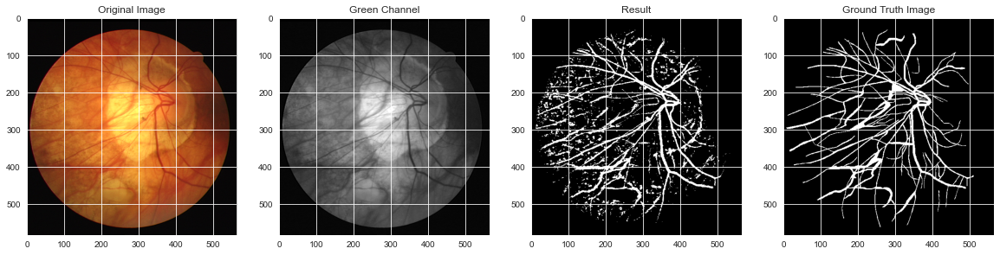

 70%|███████   | 14/20 [01:42<00:43,  7.33s/it]

D:\Data sets\DRIVE\training\images\35_training.tif
(329960,)
D:\Data sets\DRIVE\training\1st_manual\35_manual1.gif
329960
Accuracy =  0.9651806279549037
0.9643188348147735


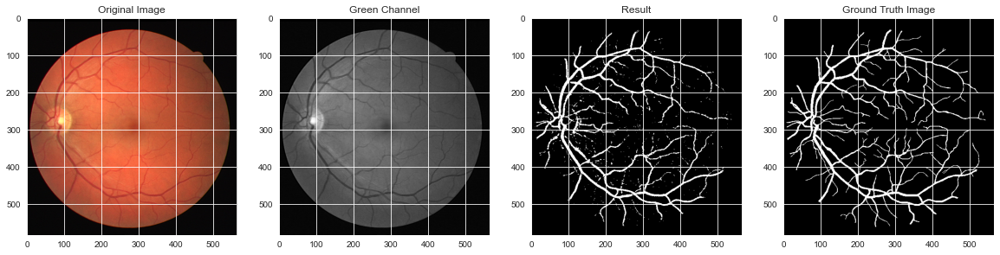

 75%|███████▌  | 15/20 [01:50<00:36,  7.31s/it]

D:\Data sets\DRIVE\training\images\36_training.tif
(329960,)
D:\Data sets\DRIVE\training\1st_manual\36_manual1.gif
329960
Accuracy =  0.953554976360771
0.9505130949948284


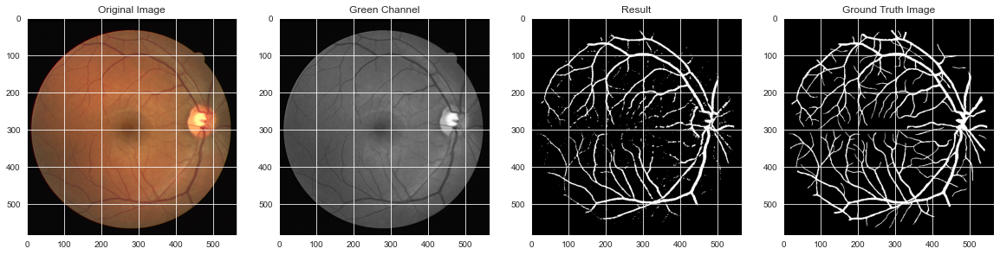

 80%|████████  | 16/20 [01:57<00:29,  7.32s/it]

D:\Data sets\DRIVE\training\images\37_training.tif
(329960,)
D:\Data sets\DRIVE\training\1st_manual\37_manual1.gif
329960
Accuracy =  0.9603982300884956
0.9598304186130107


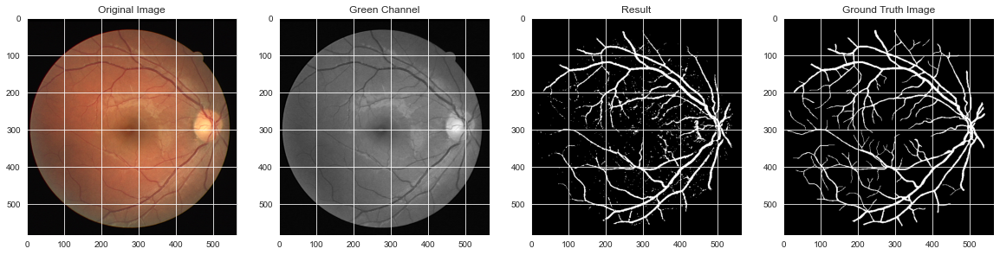

 85%|████████▌ | 17/20 [02:04<00:21,  7.31s/it]

D:\Data sets\DRIVE\training\images\38_training.tif
(329960,)
D:\Data sets\DRIVE\training\1st_manual\38_manual1.gif
329960
Accuracy =  0.9554733907140259
0.950921204353907


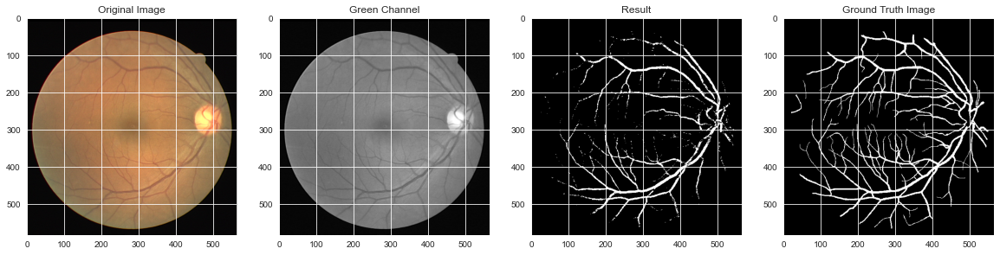

 90%|█████████ | 18/20 [02:12<00:14,  7.38s/it]

D:\Data sets\DRIVE\training\images\39_training.tif
(329960,)
D:\Data sets\DRIVE\training\1st_manual\39_manual1.gif
329960
Accuracy =  0.9588374348405867
0.9571034859315642


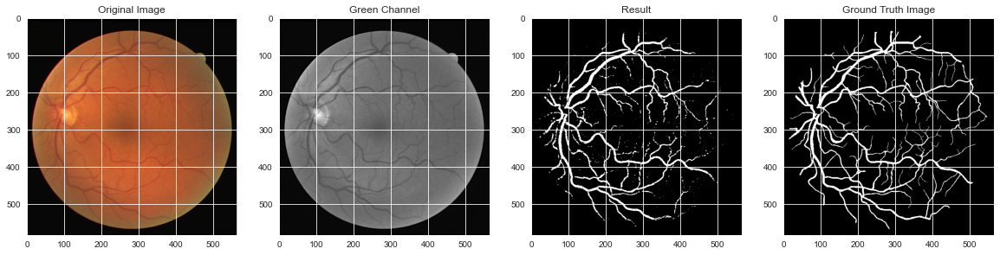

 95%|█████████▌| 19/20 [02:19<00:07,  7.39s/it]

D:\Data sets\DRIVE\training\images\40_training.tif
(329960,)
D:\Data sets\DRIVE\training\1st_manual\40_manual1.gif
329960
Accuracy =  0.9650351557764577
0.9640950849603575


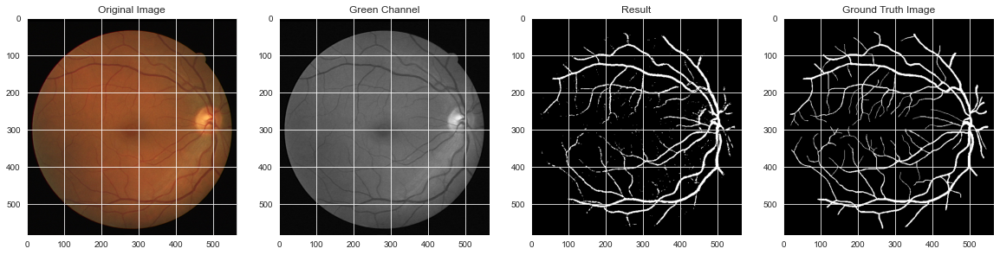

100%|██████████| 20/20 [02:27<00:00,  7.35s/it]


In [96]:
for _id in tqdm(range(len(train_ids))):
    
    image = train_ids[_id]
    gt_image = gt_ids[_id]
    

    tdf = pd.DataFrame()  #Temporary data frame for each Image

    path = train_path + "\\images\\" + image
    print(path)

    img = cv2.imread(path)
    img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    img = img[:,:,1]

#     plt.imshow(img ,cmap = "gray")

    tdf,img2 = originalImg(img,tdf)
    tdf['Image_Name'] = image
    tdf = gaborFilter(img2,tdf)

    tdf = cannyEdge(tdf,img)

    tdf = the4edgeDetectors(tdf,img)

    tdf = gmv(tdf,img)

    gt_path = train_path + "\\1st_manual\\" + gt_image
    print(gt_path)
    tdf = gtImage(gt_path,tdf)
    
    x = tdf.drop(labels = ["Image_Name","Labels"], axis=1)
    y = tdf["Labels"]
    
    prediction_test = xg_cl.predict(x)
    result = prediction_test.reshape((584, 565))
    
    
    gtImg = gtImageDis(gt_path)


    
    fig, axes = plt.subplots(1, 4, figsize=(20, 20))
    ax = axes.ravel()
    ax[0].set_title("Original Image")
    ax[0].imshow(img_rgb, cmap = 'gray')
    ax[1].set_title("Green Channel")
    ax[1].imshow(img, cmap = 'gray')
    ax[2].set_title("Result")
    ax[2].imshow(result, cmap = 'gray')
    ax[3].set_title("Ground Truth Image")
    ax[3].imshow(gtImg, cmap = 'gray')
    
    acc = metrics.accuracy_score(y, prediction_test)
    print ("Accuracy = ", acc)
    
    cm = confusion_matrix(y, prediction_test)
    sens, spe, acc = getMetrics(cm)
    
    print(f1_score(y, prediction_test, average = "weighted"))
    f1_set.append([train_ids[_id],f1_score(y, prediction_test, average = "weighted")])
    score_set.append([train_ids[_id], sens, spe, acc])
    
    filename = "Train" + str(_id + 21) + ".tif"
    result = result*1
    cv2.imwrite(filename, result)
    
    plt.show()

In [85]:
f1_df = pd.DataFrame(f1_set, columns=["Image","F1 Score"])
f1_df

,Image,F1 Score
0,21_training.tif,0.967894
1,22_training.tif,0.959434
2,23_training.tif,0.962758
3,24_training.tif,0.948206
4,25_training.tif,0.935253
5,26_training.tif,0.955233
6,27_training.tif,0.959785
7,28_training.tif,0.957145
8,29_training.tif,0.959388
9,30_training.tif,0.955353


# The Final Result

In [86]:
score_df = pd.DataFrame(score_set, columns=["Image","Sensitivity", "Specificity", "Accuracy"])
score_df

,Image,Sensitivity,Specificity,Accuracy
0,21_training.tif,0.681685,0.993000,0.969736
1,22_training.tif,0.668389,0.990961,0.961820
2,23_training.tif,0.722598,0.979568,0.962650
3,24_training.tif,0.633550,0.994042,0.952276
4,25_training.tif,0.470271,0.993449,0.943236
5,26_training.tif,0.629710,0.987747,0.957828
6,27_training.tif,0.684106,0.988521,0.961698
7,28_training.tif,0.668890,0.991237,0.959753
8,29_training.tif,0.675579,0.987462,0.961232
9,30_training.tif,0.589128,0.990127,0.958671


In [87]:
score_df["Sensitivity"].mean(), score_df["Specificity"].mean() ,score_df["Accuracy"].mean()

(0.6602062578801648, 0.9865830592309285, 0.9581615953448903)

In [88]:
import seaborn as sns

[None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None]

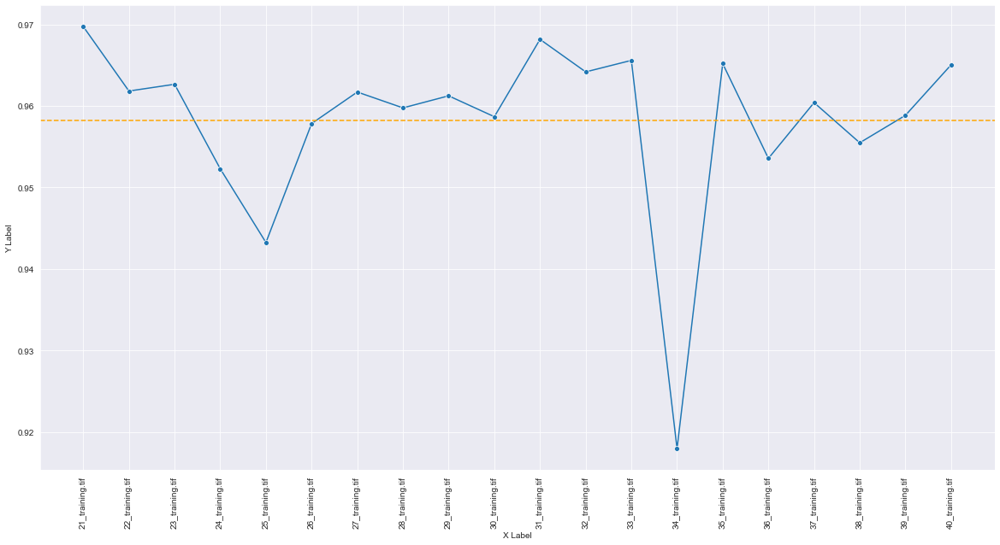

In [90]:
plt.figure(figsize=(20, 10))
sns.set_style("darkgrid")
ax = sns.lineplot(data=score_df, x="Image", y="Accuracy", marker = "o")
ax.axhline(score_df["Accuracy"].mean(), color="orange", linestyle="--")
ax.set(xlabel="X Label", ylabel = "Y Label")
plt.setp(ax.get_xticklabels(), rotation=90)


In [91]:
import pickle

In [92]:
algo_name = "xgboost20"
pickle.dump(xg_cl, open(algo_name,'wb'))

In [93]:
xg_cl

XGBClassifier(base_score=0.5, booster='gbtree', colsample_bylevel=1,
              colsample_bynode=1, colsample_bytree=1, gamma=0, gpu_id=-1,
              importance_type='gain', interaction_constraints='',
              learning_rate=0.300000012, max_delta_step=0, max_depth=6,
              min_child_weight=1, missing=nan, monotone_constraints='()',
              n_estimators=150, n_jobs=6, num_parallel_tree=1, random_state=123,
              reg_alpha=0, reg_lambda=1, scale_pos_weight=1, seed=123,
              subsample=1, tree_method='approx', validate_parameters=1,
              verbosity=None)

# The Test Images

In [97]:
# Next time change th path format
test_path = "D:\\Data sets\\DRIVE\\test"
test_ids = next(os.walk(test_path + "\\images"))[2]

In [98]:
test_ids

['01_test.tif',
 '02_test.tif',
 '03_test.tif',
 '04_test.tif',
 '05_test.tif',
 '06_test.tif',
 '07_test.tif',
 '08_test.tif',
 '09_test.tif',
 '10_test.tif',
 '11_test.tif',
 '12_test.tif',
 '13_test.tif',
 '14_test.tif',
 '15_test.tif',
 '16_test.tif',
 '17_test.tif',
 '18_test.tif',
 '19_test.tif',
 '20_test.tif']

  0%|          | 0/20 [00:00<?, ?it/s]

D:\Data sets\DRIVE\test\images\01_test.tif
(329960,)


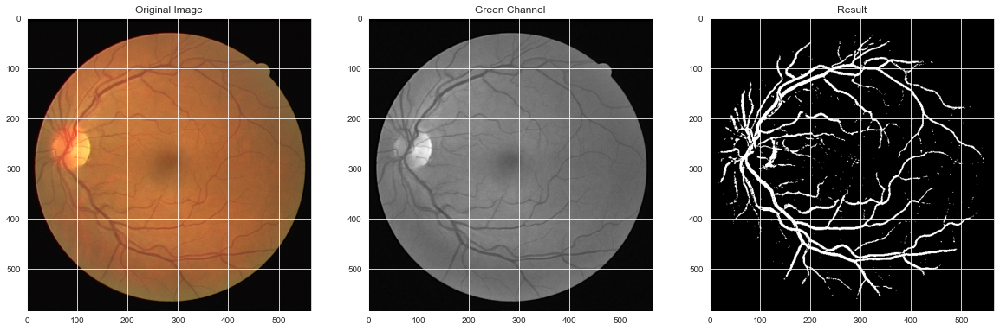

  5%|▌         | 1/20 [00:06<02:01,  6.41s/it]

D:\Data sets\DRIVE\test\images\02_test.tif
(329960,)


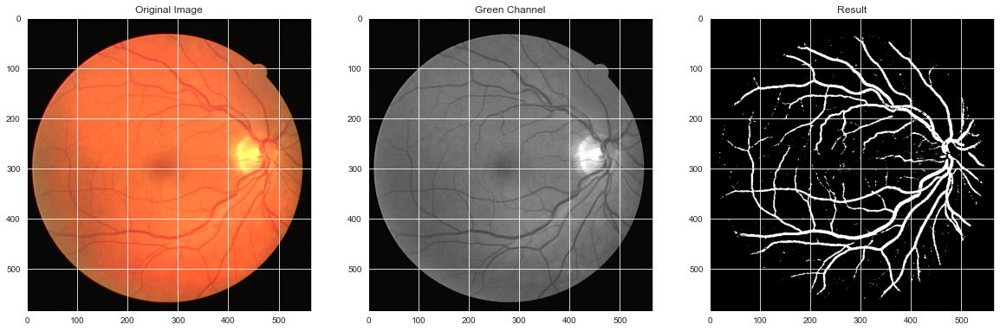

 10%|█         | 2/20 [00:12<01:56,  6.46s/it]

D:\Data sets\DRIVE\test\images\03_test.tif
(329960,)


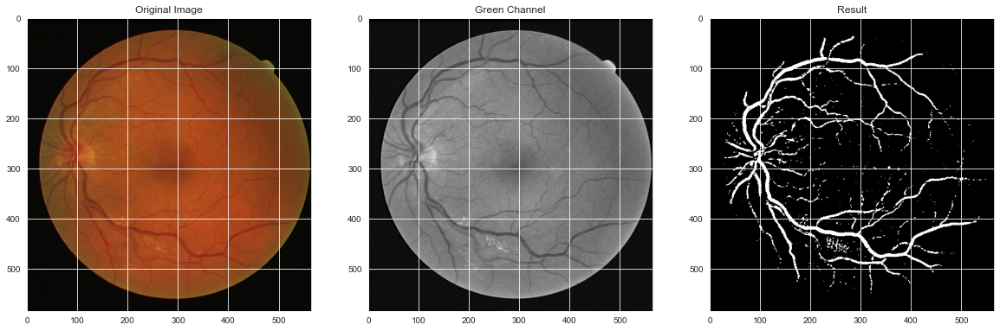

 15%|█▌        | 3/20 [00:19<01:51,  6.58s/it]

D:\Data sets\DRIVE\test\images\04_test.tif
(329960,)


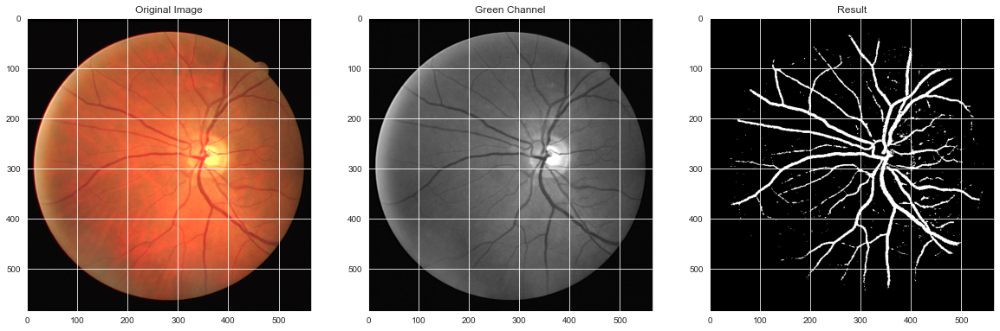

 20%|██        | 4/20 [00:27<01:50,  6.92s/it]

D:\Data sets\DRIVE\test\images\05_test.tif
(329960,)


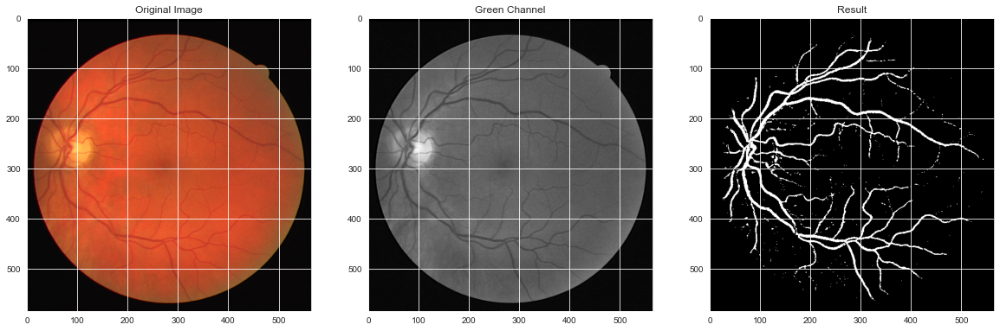

 25%|██▌       | 5/20 [00:34<01:44,  6.95s/it]

D:\Data sets\DRIVE\test\images\06_test.tif
(329960,)


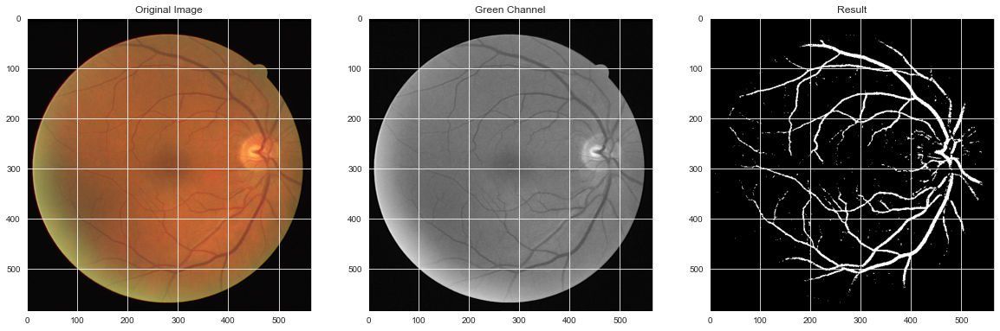

 30%|███       | 6/20 [00:41<01:36,  6.86s/it]

D:\Data sets\DRIVE\test\images\07_test.tif
(329960,)


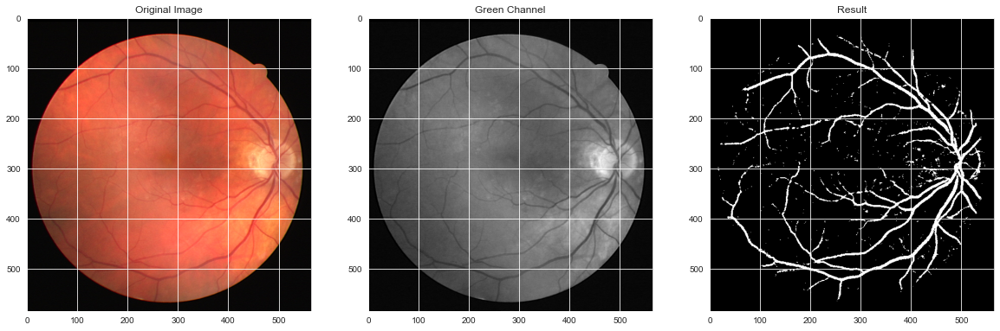

 35%|███▌      | 7/20 [00:47<01:27,  6.72s/it]

D:\Data sets\DRIVE\test\images\08_test.tif
(329960,)


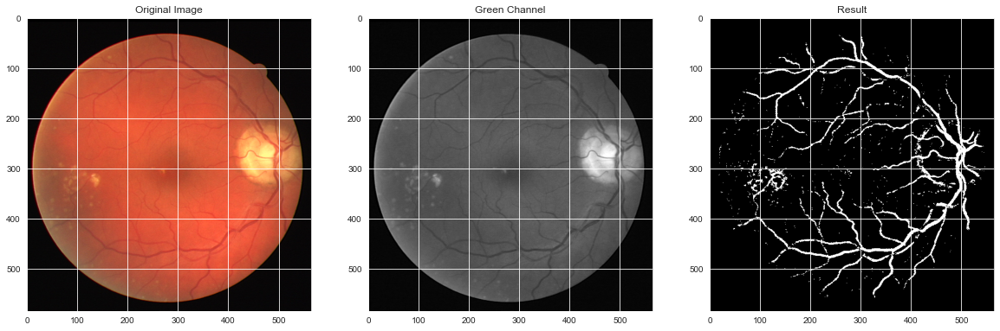

 40%|████      | 8/20 [00:54<01:19,  6.66s/it]

D:\Data sets\DRIVE\test\images\09_test.tif
(329960,)


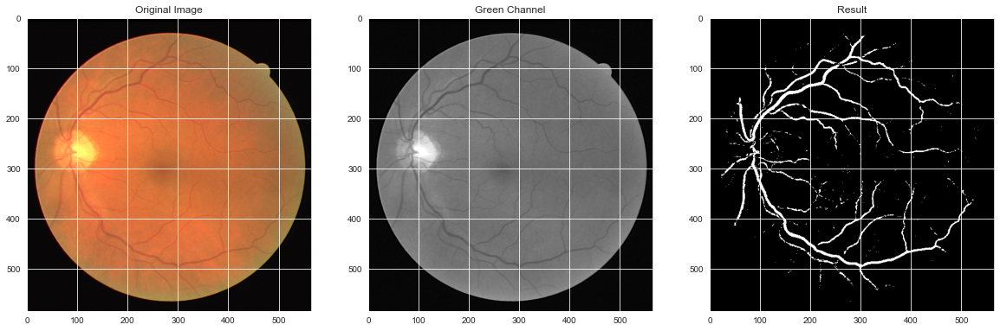

 45%|████▌     | 9/20 [01:00<01:12,  6.60s/it]

D:\Data sets\DRIVE\test\images\10_test.tif
(329960,)


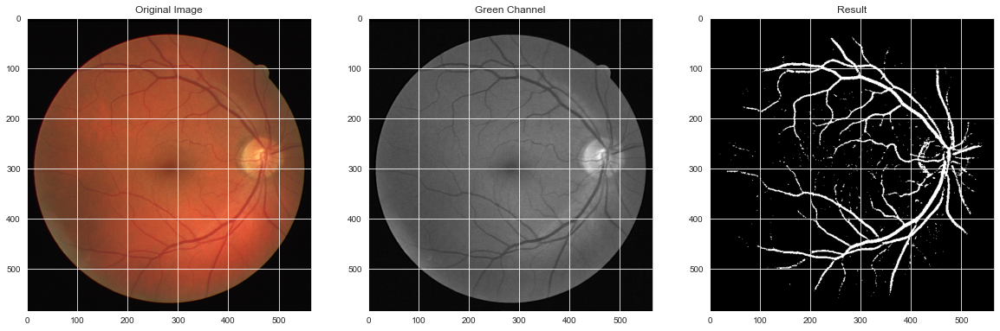

 50%|█████     | 10/20 [01:07<01:06,  6.62s/it]

D:\Data sets\DRIVE\test\images\11_test.tif
(329960,)


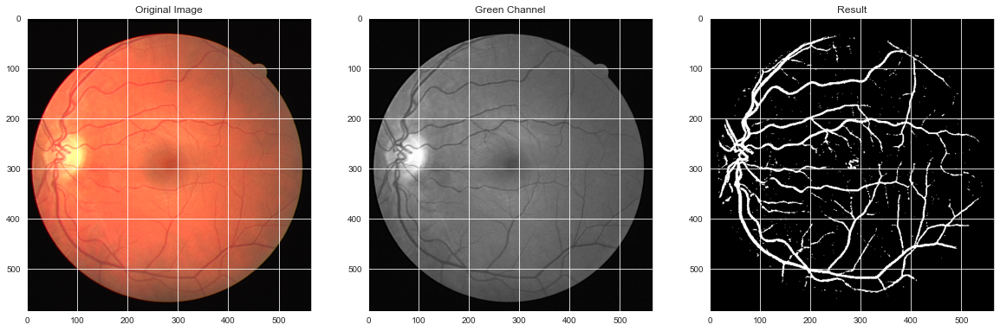

 55%|█████▌    | 11/20 [01:13<00:58,  6.54s/it]

D:\Data sets\DRIVE\test\images\12_test.tif
(329960,)


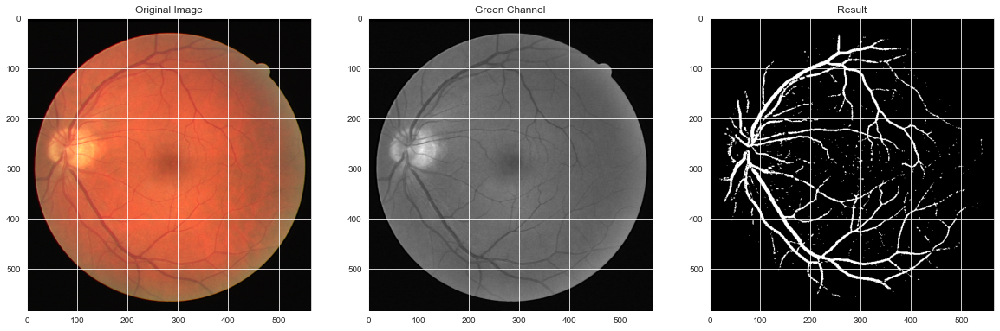

 60%|██████    | 12/20 [01:19<00:51,  6.47s/it]

D:\Data sets\DRIVE\test\images\13_test.tif
(329960,)


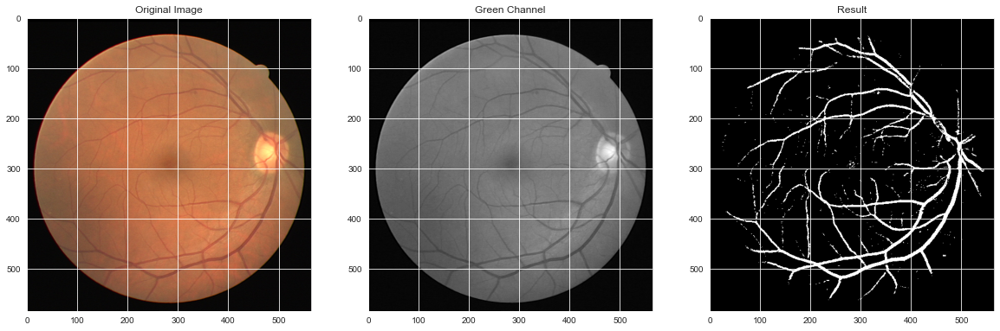

 65%|██████▌   | 13/20 [01:26<00:45,  6.46s/it]

D:\Data sets\DRIVE\test\images\14_test.tif
(329960,)


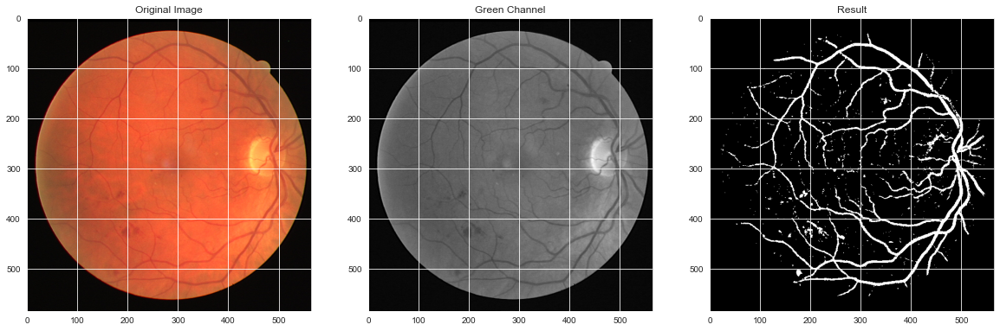

 70%|███████   | 14/20 [01:32<00:38,  6.45s/it]

D:\Data sets\DRIVE\test\images\15_test.tif
(329960,)


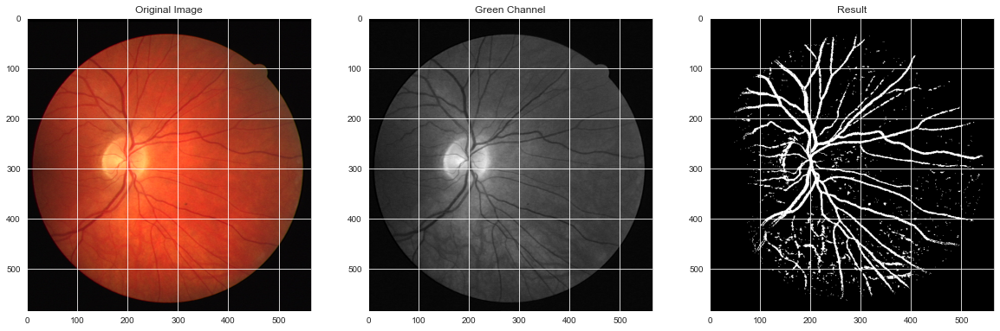

 75%|███████▌  | 15/20 [01:39<00:32,  6.52s/it]

D:\Data sets\DRIVE\test\images\16_test.tif
(329960,)


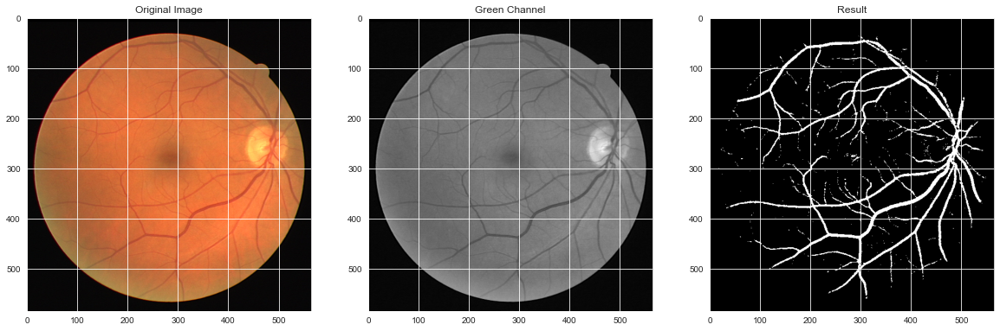

 80%|████████  | 16/20 [01:46<00:26,  6.59s/it]

D:\Data sets\DRIVE\test\images\17_test.tif
(329960,)


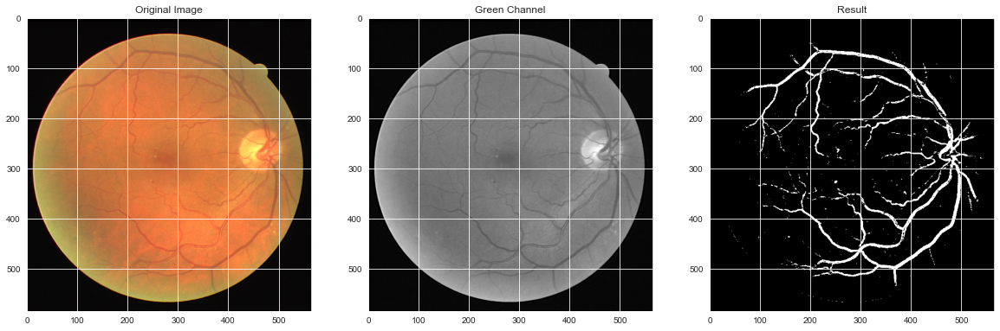

 85%|████████▌ | 17/20 [01:52<00:19,  6.52s/it]

D:\Data sets\DRIVE\test\images\18_test.tif
(329960,)


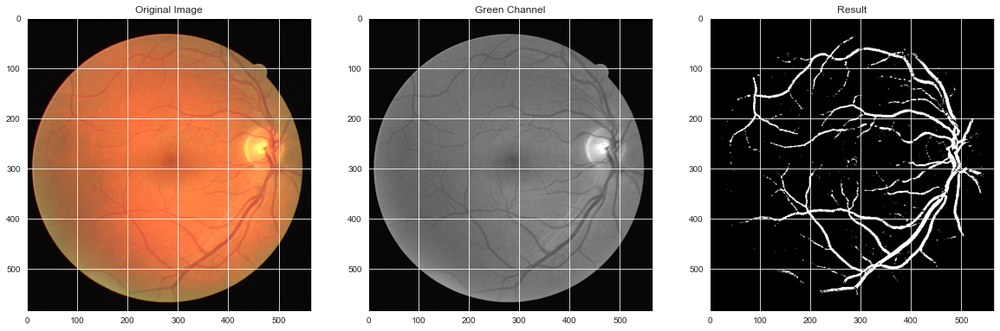

 90%|█████████ | 18/20 [01:58<00:12,  6.49s/it]

D:\Data sets\DRIVE\test\images\19_test.tif
(329960,)


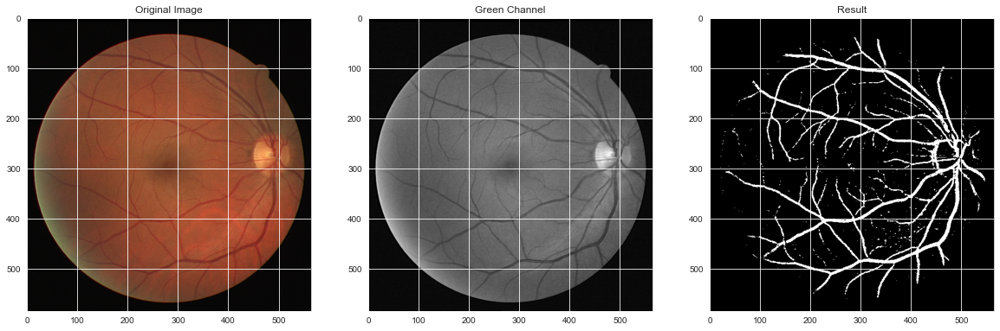

 95%|█████████▌| 19/20 [02:05<00:06,  6.48s/it]

D:\Data sets\DRIVE\test\images\20_test.tif
(329960,)


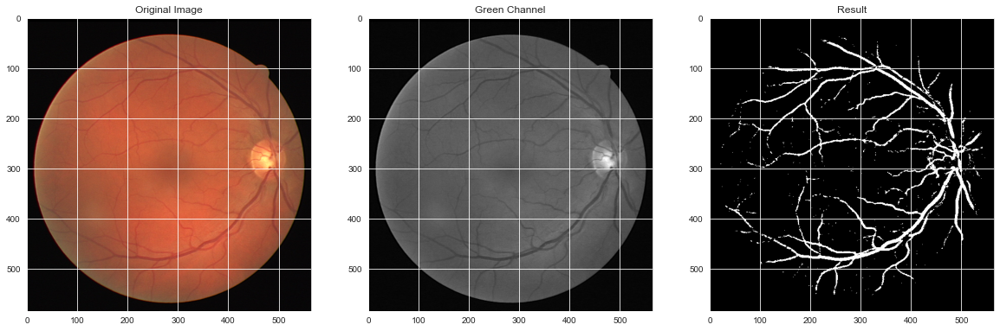

100%|██████████| 20/20 [02:12<00:00,  6.62s/it]


In [111]:
for _id in tqdm(range(len(test_ids))):
    
    image = test_ids[_id]

    tdf = pd.DataFrame()  #Temporary data frame for each Image

    path = test_path + "\\images\\" + image
    print(path)

    img = cv2.imread(path)
    img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    img = img[:,:,1]

#     plt.imshow(img ,cmap = "gray")

    tdf,img2 = originalImg(img,tdf)
    tdf['Image_Name'] = image
    tdf = gaborFilter(img2,tdf)

    tdf = cannyEdge(tdf,img)

    tdf = the4edgeDetectors(tdf,img)

    tdf = gmv(tdf,img)

    
    x = tdf.drop(labels = ["Image_Name"], axis=1)
    
    prediction_test = xg_cl.predict(x)
    result = prediction_test.reshape((584, 565))


    
    fig, axes = plt.subplots(1, 3, figsize=(20, 20))
    ax = axes.ravel()
    ax[0].set_title("Original Image")
    ax[0].imshow(img_rgb, cmap = 'gray')
    ax[1].set_title("Green Channel")
    ax[1].imshow(img, cmap = 'gray')
    ax[2].set_title("Result")
    ax[2].imshow(result, cmap = 'gray')

    filename = str(_id + 1) + ".png"
    result = result * 1
#     cv2.imwrite(filename, result)
    plt.imsave(filename, result)

    plt.show()

In [103]:
boolean_list = [[True, False],[True, False]]

integer_map = map(int, boolean_list)


integer_list = list(integer_map)


print(integer_list)

TypeError: int() argument must be a string, a bytes-like object or a number, not 'list'

In [107]:
s = [True,False]*4
s

[True, False, True, False, True, False, True, False]